# Pygmt 101 繪圖
##### 2023 Summer Student Program, Dep. of Earth Sciences, NTNU
###### Jing-Hui Tong 2023/06/17
###### Coutesy of IRIS ROSES unit05 on 2021/07/20 from Liam Toney, Geophysical Institute, University of Alaska Fairbanks
######  https://www.pygmt.org/latest/index.html

In [1]:
import pygmt
import pandas as pd

### The `config` argument: Change GMT defaults globall

detail please see: https://docs.generic-mapping-tools.org/latest/gmt.conf.html

* **length unit**

  c: cm

  i: inch(2.54 cm)

  p: point(1/72 of an inch)

In [37]:
pygmt.config(FONT_ANNOT_PRIMARY = '10p,Times-Roman',
            FONT_LABEL = '8',
            MAP_LABEL_OFFSET = '4p',
            MAP_TICK_LENGTH_PRIMARY = '5p',
            PROJ_LENGTH_UNIT = 'c',
            MAP_ANNOT_OFFSET_PRIMARY = '5p',
            MAP_ANNOT_OFFSET_SECONDARY = '5p',
            MAP_FRAME_TYPE = 'fancy',
            MAP_FRAME_WIDTH = 'auto',
            MAP_SCALE_HEIGHT='20p',
            FORMAT_GEO_MAP = 'D',
            PS_CHAR_ENCODING = 'Standard+',
            MAP_FRAME_PEN = '2p,black')

In PyGMT, every plot or map must start with the creation of a [`pygmt.Figure`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.html#pygmt.Figure)

In [38]:
fig = pygmt.Figure()

Your first pygmt figure! 

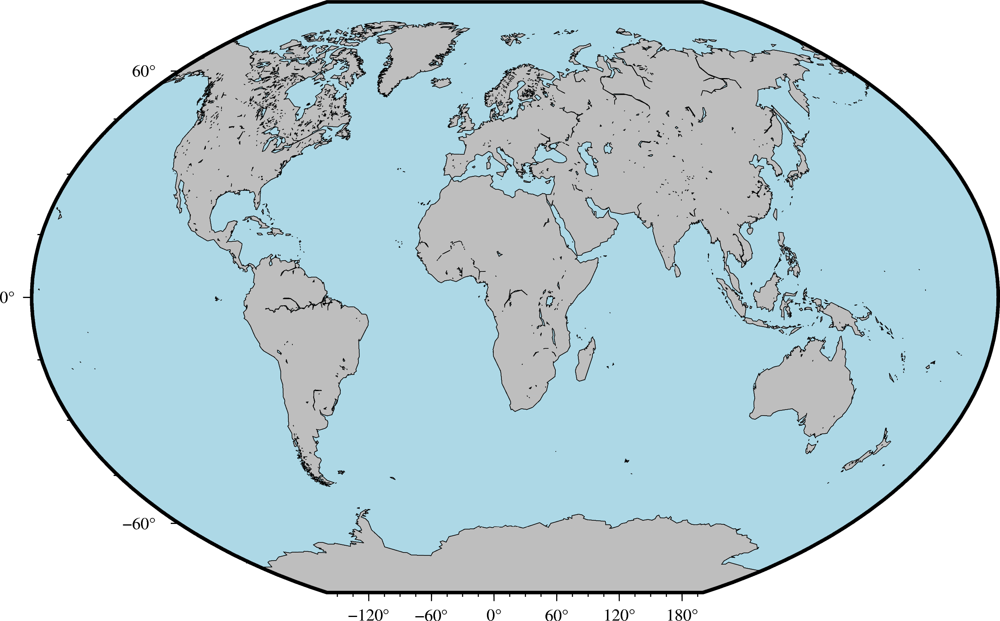

In [39]:
fig.coast(
    region='g',
    projection='R20/8i',
    shorelines=True,
    water='lightblue',
    land='grey',
    frame=True)

fig.show()

### The `region` argument

  The `region` argument controls the geographic or Cartesian extent of the figure. (In PyGMT parlance, we call `region` an "alias" for `R`.) In PyGMT, regions are specified as lists of `[xmin, xmax, ymin, ymax]`, e.g. `region=[45, 55, 135, 145]`. I used another shortcut, `region='g'`, which specifies a **global** domain.
  
### The  `projection` argument

  The `projection` argument controls the map projection. GMT (and therefore PyGMT) supports 31 different map projections, from basic Cartesian axes to [arbitrary vertical perspectives](https://docs.generic-mapping-tools.org/latest/gallery/ex26.html). Again, if you're familiar with GMT, these are specified using the `-J` flag, as in `-JM4i`. In PyGMT, projections codes are still strings, but the `J` is dropped, so an equivalent PyGMT argument would be `projection='M4i'`.
  
  -> different projection method:
  https://www.pygmt.org/latest/projections/index.html



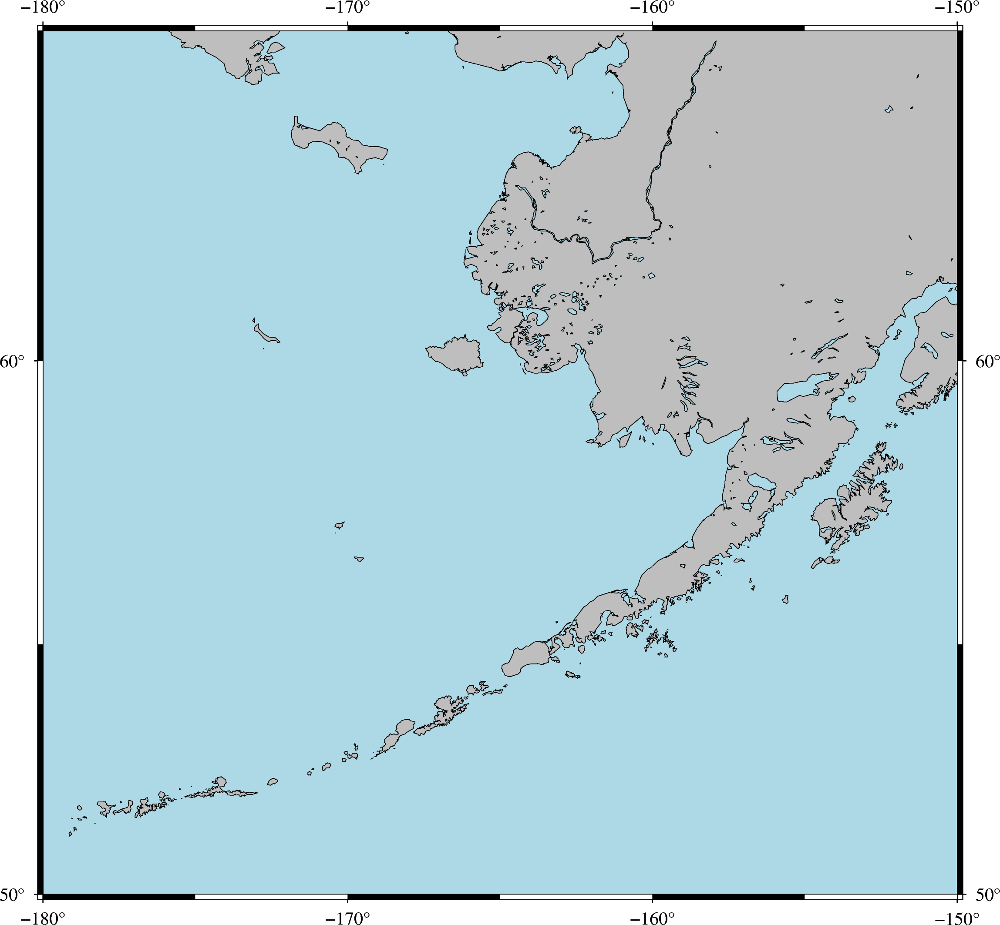

In [91]:
fig = pygmt.Figure()
fig.coast(
    region=[-180, -150, 50, 65],  
    projection='M7i',
    shorelines=True,  ## 海岸線
    water='lightblue', ## 海的顏色
    land='grey', ##陸地的顏色
    frame=['WSNE','a10f5']) ##邊框
fig.show()

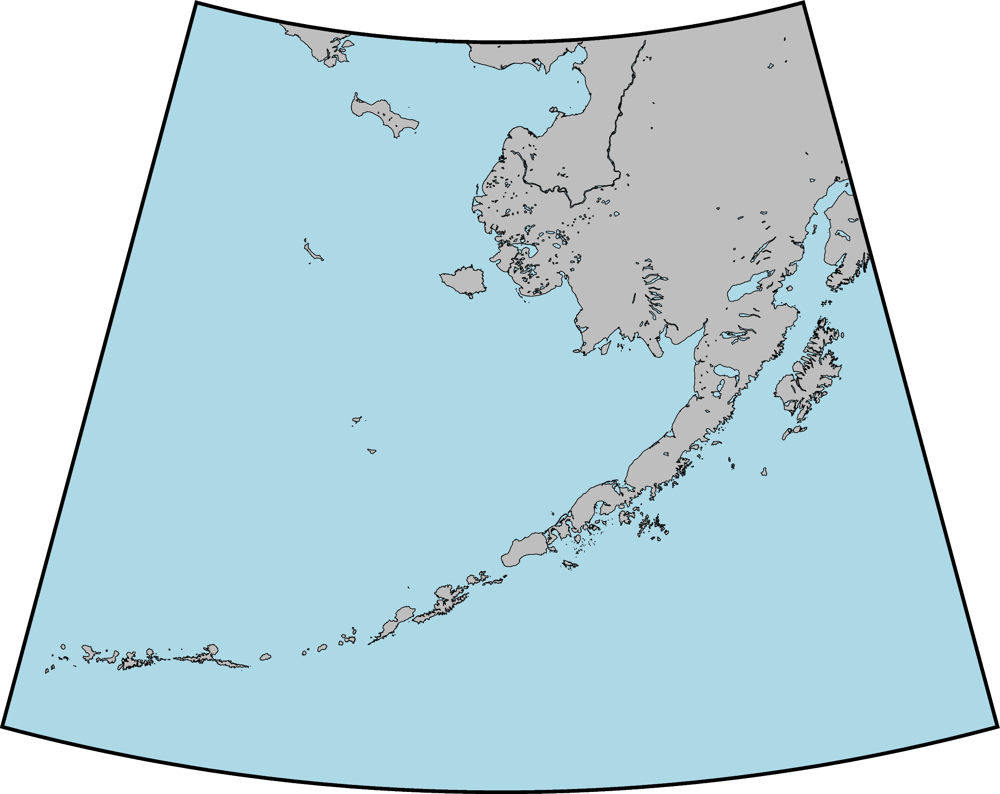

In [92]:
fig = pygmt.Figure()
fig.coast(
    region=[-180, -150, 50, 65],
    projection='S-165/90/8i', 
    shorelines=True,
    water='lightblue',
    land='grey',
    frame=0,
    resolution='h', 
)
fig.show()

### `pygmt.makecpt()`
Make GMT color palette tables.
* cmap: types https://docs.generic-mapping-tools.org/latest/cookbook/cpts.html
* series: [ min/max ]  Defines the range of the new CPT 
* continuous: True/False (default=False, namely "discrete")


In [93]:
## make colorbar 
pygmt.makecpt(cmap="geo", 
              series=[-8000, 7000, 500], 
              output = 'eleva.cpt',
              continuous=True)

### `pygmt.grdcut()`
[`pygmt.grdcut()`](https://www.pygmt.org/latest/api/generated/pygmt.grdcut.html) "Produce a new outgrid" file which is a subregion of grid.

* grid: The file name of the input grid
##### The available datasets: "@" [global relief data and NASA satellite imagery](https://www.generic-mapping-tools.org/remote-datasets/)
* region: [xmin/xmax/ymin/ymax]; Specify the region of interest.

In [94]:
pygmt.grdcut(grid='@earth_relief_30s', 
             outgrid='Alaska.grd', 
             region=[-180, -150, 50, 65]) 

pygmt-session [WARNING]: Remote dataset given to a data processing module but no registration was specified - default to gridline registration (if available)


In [95]:
print(pygmt.grdinfo(grid='Alaska.grd'))

Alaska.grd: Title: 
Alaska.grd: Command: gmt grdcut @earth_relief_30s_g/ -GAlaska.grd -R-180/-150/50/65
Alaska.grd: Remark: 
Alaska.grd: Gridline node registration used [Geographic grid]
Alaska.grd: Grid file format: nf = GMT netCDF format (32-bit float), CF-1.7
Alaska.grd: x_min: -180 x_max: -150 x_inc: 0.00833333333333 (30 sec) name: longitude n_columns: 3601
Alaska.grd: y_min: 50 y_max: 65 y_inc: 0.00833333333333 (30 sec) name: latitude n_rows: 1801
Alaska.grd: v_min: -7819.5 v_max: 6059.5 name: z
Alaska.grd: scale_factor: 1 add_offset: 0
Alaska.grd: format: netCDF-4 chunk_size: 129,129 shuffle: on deflation_level: 3
Alaska.grd: Default CPT: geo



### `Figure.grdimage()`

[`Figure.grdimage()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.grdimage.html#pygmt.Figure.grdimage) Project and plot grids or images

* grid: The file name of the input grid
##### The available datasets: "@" [global relief data and NASA satellite imagery](https://www.generic-mapping-tools.org/remote-datasets/)
* cmap: File name of a CPT file 
* transparency: Set transparency level, in [0-100] percent range. Default is 0

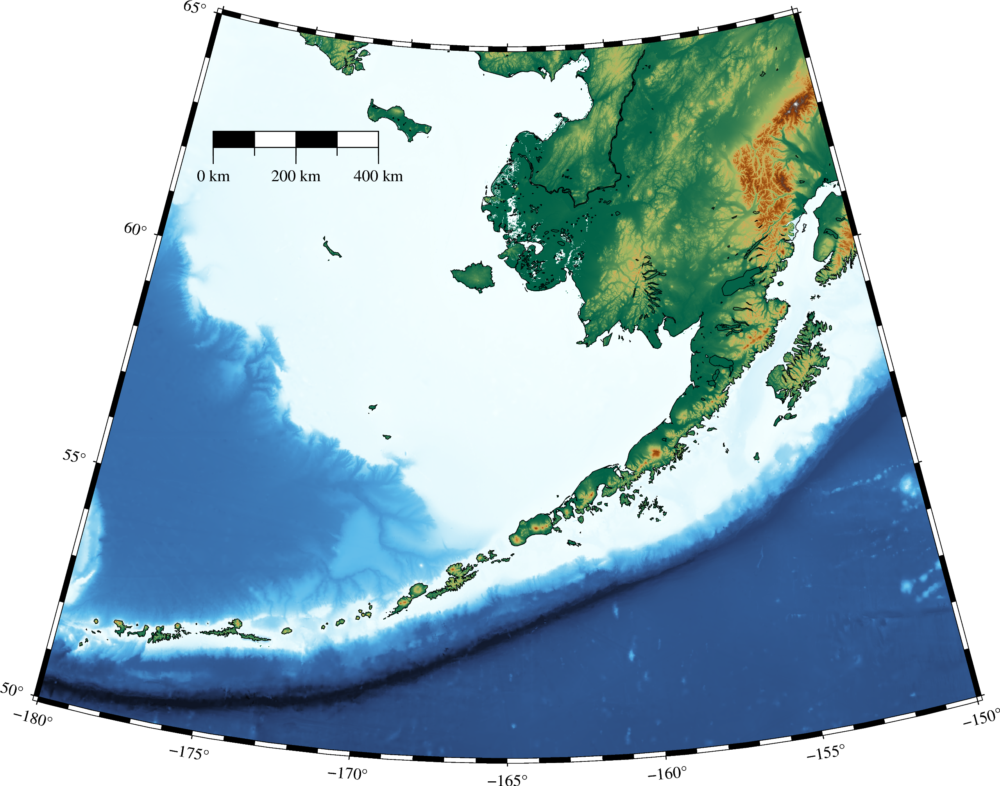

In [96]:
grid = 'Alaska.grd'
fig = pygmt.Figure()

fig.grdimage(grid=grid,
             projection='S-165/90/8i',
             cmap="eleva.cpt", 
             transparency=0)

fig.coast(projection='S-165/90/8i', 
    shorelines=True,
    region=[-180, -150, 50, 65],
    frame=True,
    resolution='i',
    map_scale='g-175/62.5/-150/55+w400k+f+u') 



fig.show()

### `Figure.grdcontour()`

[`Figure.grdcontour()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.grdcontour.html) Convert grids or images to contours and plot them on maps.

* grid: The file name of the input grid
* annotation: str/int/float -> Specify or disable annotated contour levels
* interval: Specify the contour lines to generate.
* limit: [low/high] ->ONLY draw contours between the range
* pen: linewidth,color -> Set pen attributes for lines

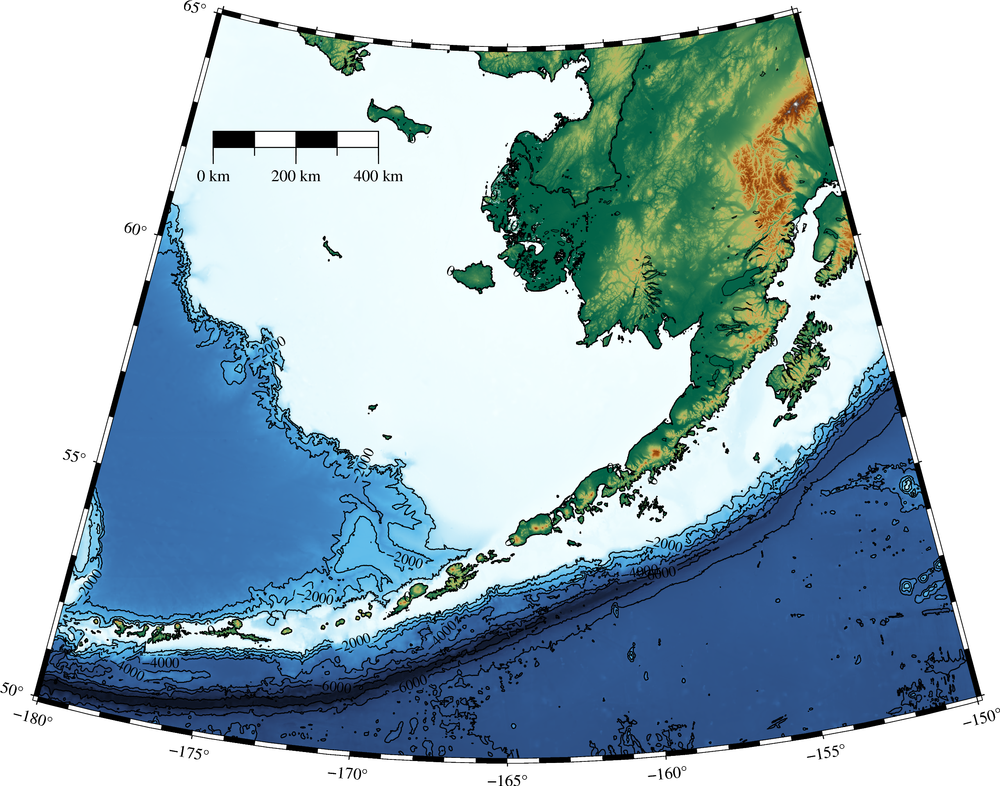

In [97]:
fig.grdcontour(grid=grid,
               annotation=2000,
               interval=1000,
               limit=[-8000, 0 ],
               pen='0.5p,black')


fig.show()

### `Figure.colorbar()`

[`Figure.colorbar()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.colorbar.html) Plot a gray or color scale-bar on maps.

* cmap: File name of a CPT file
* position:  
    **x** for plot coordinates: x/y  
    **+w** for length and width of the color bar  
    **+m** for colorbar title position  
    **+h** horizontal colorbar, if you want to plot vertical one, use **+v**
* frame: Set color bar boundary frame, labels, and axes attributes

##### especially for **+m**:
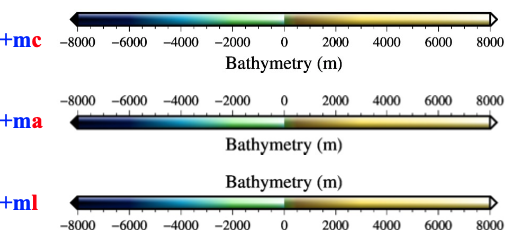

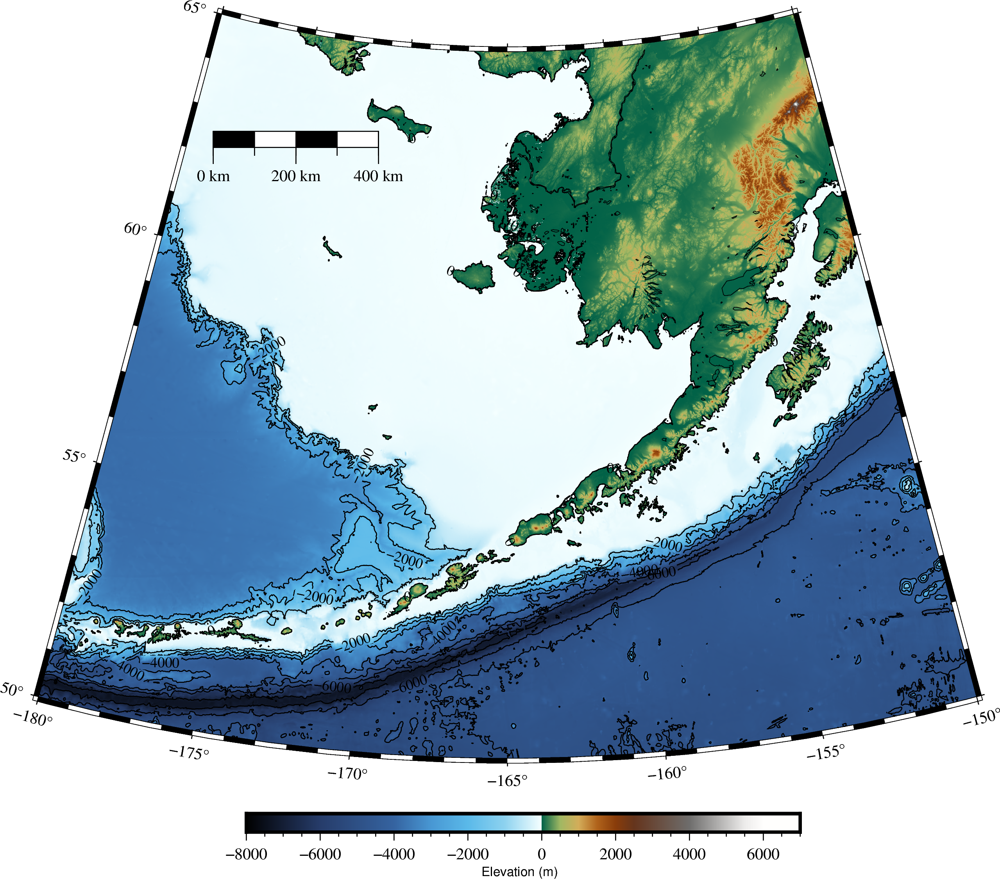

In [98]:
fig.colorbar(cmap = 'eleva.cpt', 
             position = 'x4.5/-1.6+w12c/0.4c+mc+h', 
             frame = 'a2000f500+l"Elevation (m)"  ') 

fig.show()

## Adding more 

In [99]:
df = pd.read_csv('Alaska_events.csv')

In [100]:
df.head()

,time,lat,lon,dep,mag
0,2023-06-16T07:23:29.956000Z,64.4203,-163.6382,14.200,4.2
1,2023-06-16T07:04:13.434000Z,55.3289,-156.7338,9.500,4.6
2,2023-06-13T20:08:13.519000Z,61.3905,-150.8825,56.500,4.3
3,2023-06-13T16:16:02.390000Z,51.4427,-178.4426,16.252,5.3
4,2023-06-12T06:30:44.319000Z,52.8030,-170.4383,114.088,4.0


In [101]:
df.describe()

,lat,lon,dep,mag
count,1058.000000,1058.000000,1058.000000,1058.000000
mean,54.288462,-164.238951,42.752835,4.468336
std,2.761165,8.722621,43.172324,0.499739
min,50.123800,-179.992100,0.000000,4.000000
25%,52.226150,-170.990925,17.310000,4.100000
50%,54.215350,-160.930550,32.815000,4.300000
75%,55.164750,-157.431075,46.040000,4.700000
max,64.829600,-150.013600,306.810000,8.200000


### `Figure.plot()`

[`Figure.plot()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.plot.html) Plot lines, polygons, and symbols in 2-D.

> **Must provide either data or x/y**

* style: [Plot symbols](https://www.pygmt.org/latest/gallery/symbols/basic_symbols.html#sphx-glr-gallery-symbols-basic-symbols-py)
* color: Select color for filling of symbols, for more color-->[list color](https://docs.generic-mapping-tools.org/6.2/gmtcolors.html)
* pen: Set pen attributes for lines or the outline of symbols

In [102]:
df_mw4 = df[df['mag']>=4][df['mag']<5]
df_mw5 = df[df['mag']>=5][df['mag']<6]
df_mw6 = df[df['mag']>=6][df['mag']<7]
df_mw7 = df[df['mag']>=7]

/var/folders/4t/8m_6mnsj5878012mrchq59h00000gn/T/ipykernel_92943/3755383713.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_mw5 = df[df['mag']>=5][df['mag']<6]
/var/folders/4t/8m_6mnsj5878012mrchq59h00000gn/T/ipykernel_92943/3755383713.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_mw6 = df[df['mag']>=6][df['mag']<7]


In [103]:
pygmt.makecpt(cmap="mag", 
              series=[0,300,10], 
              output = 'depth.cpt',
              continuous=True)

makecpt [WARNING]: mag is a discrete CPT. You can stretch it (-T<min>/<max>) but not interpolate it (-T<min>/<max>/<inc>).
makecpt [WARNING]: Selecting the given range and ignoring the increment setting.


/var/folders/4t/8m_6mnsj5878012mrchq59h00000gn/T/ipykernel_92943/2144678948.py:1: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=df_mw4['lon'],
/var/folders/4t/8m_6mnsj5878012mrchq59h00000gn/T/ipykernel_92943/2144678948.py:8: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=df_mw5['lon'],
/var/folders/4t/8m_6mnsj5878012mrchq59h00000gn/T/ipykernel_92943/2144678948.py:15: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=df_mw6['lon'],
/var/folders/4t/8m_6mnsj5878012mrchq59h00000gn/T/ipykernel_92943/2144678948.py:22: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=df_mw7['lon'],


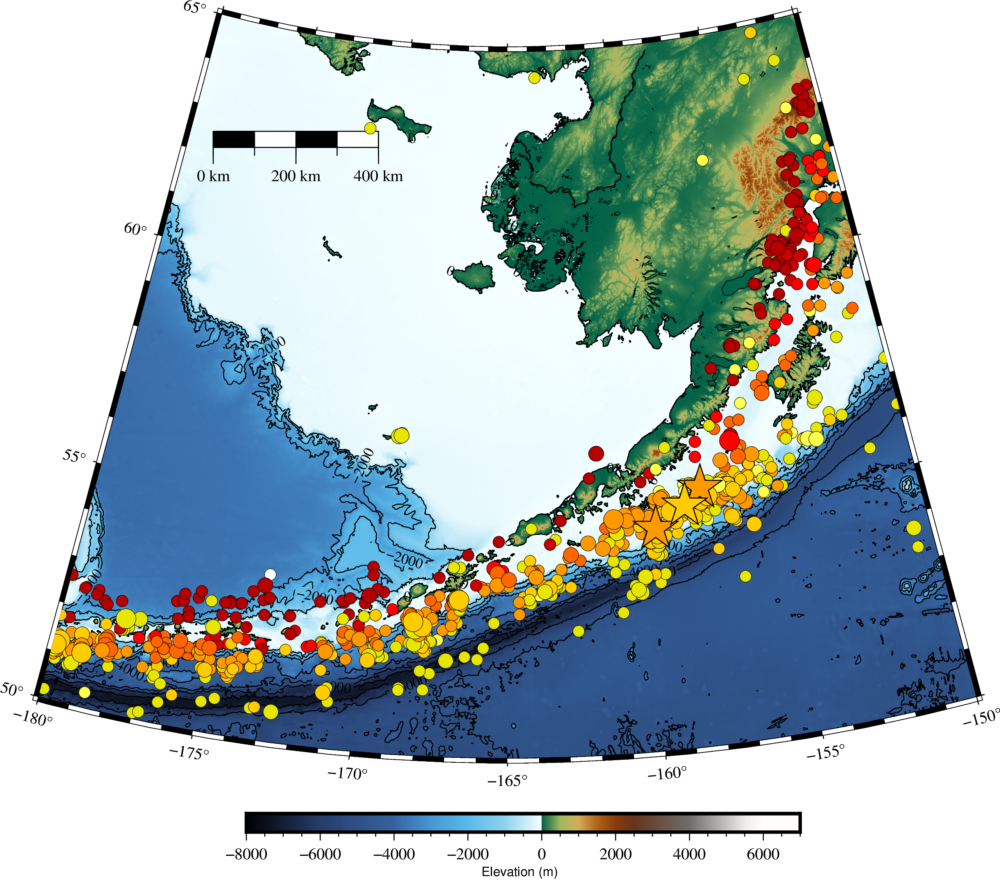

In [104]:
fig.plot(x=df_mw4['lon'],
         y=df_mw4['lat'],
         color=df_mw4['dep'],
         style='c0.1i',  
         cmap ='depth.cpt',  
         pen='0.1p,black')

fig.plot(x=df_mw5['lon'],
         y=df_mw5['lat'],
         color=df_mw5['dep'],
         style='c0.13i',  
         cmap ='depth.cpt',  
         pen='0.1p,black')

fig.plot(x=df_mw6['lon'],
         y=df_mw6['lat'],
         color=df_mw6['dep'],
         style='c0.17i',  
         cmap ='depth.cpt',  
         pen='0.1p,black')

fig.plot(x=df_mw7['lon'],
         y=df_mw7['lat'],
         color=df_mw7['dep'],
         style='a0.4i',  
         cmap ='depth.cpt',  
         pen='0.5p,black')
fig.show()

### `Figure.text()`

[`Figure.text()`](https://www.pygmt.org/latest/api/generated/pygmt.Figure.text.html) Plot or typeset text strings of variable size, font type, and orientation.

> **Must provide at least one of the following combinations as input:
> * textfiles
> * x/y, and text
> * position and text 


* font: size,font,color e.g. `font="12p,Helvetica-Bold,red"`
* justify: Sets reference point on the map for the text 
* fill: filling the text box [Default is no fill].
* pen: draw a rectangle around the text string


##### especially for **justify**:
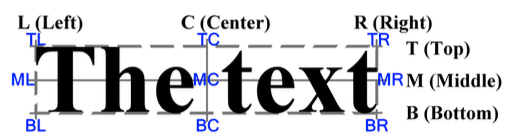

In [105]:
df_mw7['time']

526    2021-07-29T06:15:49.188000Z
801    2020-10-19T20:54:39.436000Z
918    2020-07-22T06:12:44.593000Z
Name: time, dtype: object

text [WARNING]: Horizontal text justification not set, defaults to L(eft)


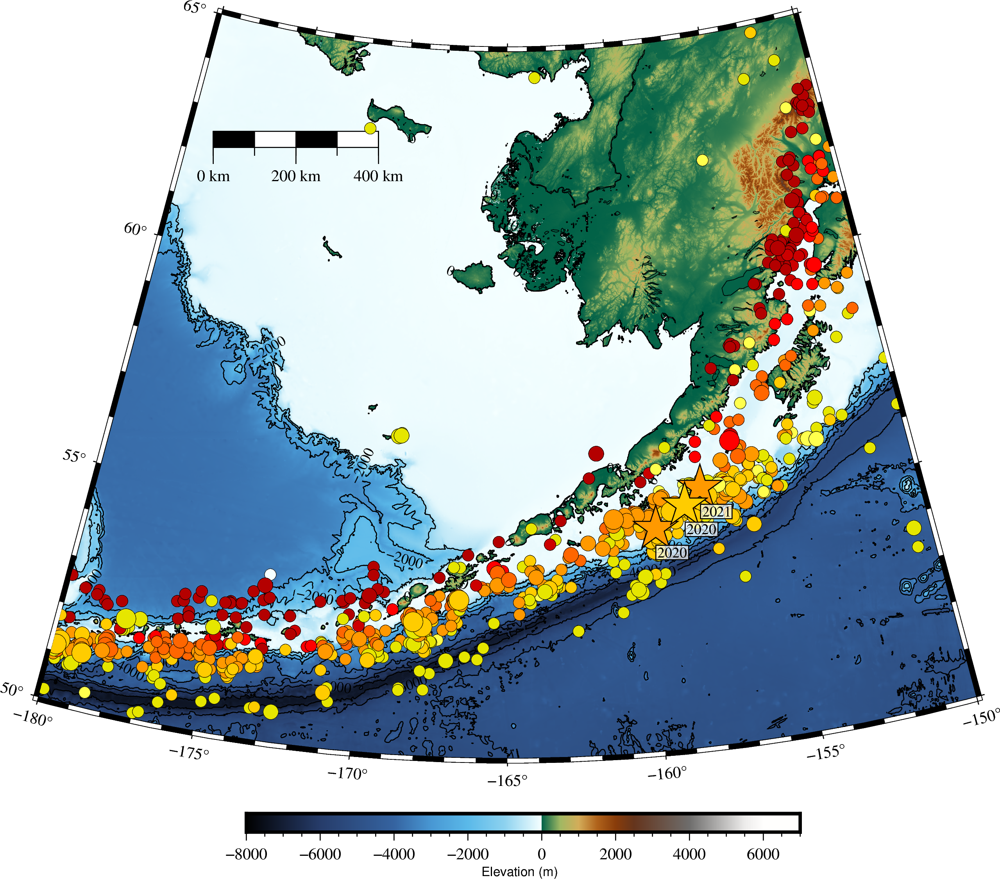

In [106]:
fig.text(x=df_mw7['lon'],
         y=df_mw7['lat']-0.4, 
         text=['2021', '2020', '2020'],
         font='9p,black',
         justify='BT',
         fill='white@30', 
         pen='0.5p,black')
fig.show()

In [ ]:
fig.savefig('Alaska.png', dpi=150)
fig.savefig('Alaska.pdf')

#### Extra website for pygmt or GMT6(shell script)
1. https://docs.gmt-china.org/latest/#
2. https://www.pygmt.org/latest/index.html
3. http://gmt-tutorials.org/index.html
